<a href="https://colab.research.google.com/github/abhishakvarshney/Global_Wheat_Detection/blob/master/Global_Wheat_Detection_YoloV5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
from tqdm.auto import tqdm
import shutil as sh

In [3]:
!git clone https://github.com/ultralytics/yolov5
!mv yolov5/* .
# !cp -r yolov5/* .

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [24]:
!unzip "719180_1251699_bundle_archive.zip" -d "configYolo5"
!rm -rf  719180_1251699_bundle_archive.zip

In [10]:
def download_data(data_file_name):
    !wget "https://storage.googleapis.com/kaggle-competitions-data/kaggle-v2/19989/1160143/bundle/archive.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1593880829&Signature=a%2FpzIOBODNBSDwNZGZjuxnGZWZasWecBZ%2FlatZ6bKs01Q3WMAMWnm%2FYlSHk%2FdBoeKVCdpO%2BYdeauRyDD6DSZAgSfcBrAauDjbmQSCC%2FjS4L3JulBlXim74gnvjCfxpB8kVZbV8%2FOgOQlkTcIy1eutM%2B2w73CpekeOk2mAUxtu3b8IpgJ2SBgJywldY9TAjNn6VENbtZb7jDyx7DnCZ5KZu1LqjFV%2B5Z7zqq2axMylWqKdOqOJyEXUiM5qTfwdIeWvJcyaLNXqG5DhE481cGETuevpDkN4As7WwzOPneKhVdwAB0WGe7RZkUbL0IeXAaOPDDerKcbLqpcKezcPWIfdw%3D%3D&response-content-disposition=attachment%3B+filename%3Dglobal-wheat-detection.zip" -O data_file_name
    !unzip data_file_name
    !rm -rf data_file_name
download_data("data.zip")

--2020-07-03 06:04:05--  https://storage.googleapis.com/kaggle-competitions-data/kaggle-v2/19989/1160143/bundle/archive.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1593880829&Signature=a%2FpzIOBODNBSDwNZGZjuxnGZWZasWecBZ%2FlatZ6bKs01Q3WMAMWnm%2FYlSHk%2FdBoeKVCdpO%2BYdeauRyDD6DSZAgSfcBrAauDjbmQSCC%2FjS4L3JulBlXim74gnvjCfxpB8kVZbV8%2FOgOQlkTcIy1eutM%2B2w73CpekeOk2mAUxtu3b8IpgJ2SBgJywldY9TAjNn6VENbtZb7jDyx7DnCZ5KZu1LqjFV%2B5Z7zqq2axMylWqKdOqOJyEXUiM5qTfwdIeWvJcyaLNXqG5DhE481cGETuevpDkN4As7WwzOPneKhVdwAB0WGe7RZkUbL0IeXAaOPDDerKcbLqpcKezcPWIfdw%3D%3D&response-content-disposition=attachment%3B+filename%3Dglobal-wheat-detection.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.69.128, 108.177.96.128, 108.177.119.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.69.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 636694264 (607M) [application/zip]
Saving to: ‘data_file_name’

data_fil

In [11]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style('darkgrid')
import shutil as sh

from sklearn import preprocessing

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [5]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 25, done.
remote: Counting objects: 100% (25/25), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 937 (delta 11), reused 11 (delta 2), pack-reused 912
Receiving objects: 100% (937/937), 3.42 MiB | 3.03 MiB/s, done.
Resolving deltas: 100% (617/617), done.


In [12]:
# !mv yolov5/* ./
!pip install -r requirements.txt

  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-wnxfrmtg
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-wnxfrmtg
     |████████████████████████████████| 20.4MB 1.4MB/s 
     |████████████████████████████████| 276kB 51.7MB/s 
  Created wheel for PyYAML: filename=PyYAML-5.3.1-cp36-cp36m-linux_x86_64.whl size=44621 sha256=6cc3ca4602dec135d412a27d0c5b04641496c17bfbcd7e53c964fbe1691257d6
  Stored in directory: /root/.cache/pip/wheels/a7/c1/ea/cf5bd31012e735dc1dfea3131a2d5eae7978b251083d6247bd
  Created wheel for pycocotools: filename=pycocotools-2.0-cp36-cp36m-linux_x86_64.whl size=266989 sha256=579ee311affa01f4fd51e459630d055d0bb48640ed9c6f5f0716e37fe4ddf2af
  Stored in directory: /tmp/pip-ephem-wheel-cache-vonrc6n0/wheels/90/51/41/646daf401c3bc408ff10de34ec76587a9b3ebfac8d21ca5c3a
Successfully built PyYAML pycocotools
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incom

In [16]:
df = pd.read_csv('train.csv')
bboxs = np.stack(df['bbox'].apply(lambda x: np.fromstring(x[1:-1], sep=',')))
for i, column in enumerate(['x', 'y', 'w', 'h']):
    df[column] = bboxs[:,i]
df.drop(columns=['bbox'], inplace=True)
df['x_center'] = df['x'] + df['w']/2
df['y_center'] = df['y'] + df['h']/2
df['classes'] = 0
from tqdm.auto import tqdm
import shutil as sh
df = df[['image_id','x', 'y', 'w', 'h','x_center','y_center','classes']]

In [17]:
df.head()

,image_id,x,y,w,h,x_center,y_center,classes
0,b6ab77fd7,834.0,222.0,56.0,36.0,862.0,240.0,0
1,b6ab77fd7,226.0,548.0,130.0,58.0,291.0,577.0,0
2,b6ab77fd7,377.0,504.0,74.0,160.0,414.0,584.0,0
3,b6ab77fd7,834.0,95.0,109.0,107.0,888.5,148.5,0
4,b6ab77fd7,26.0,144.0,124.0,117.0,88.0,202.5,0


In [18]:
index = list(set(df.image_id))

In [19]:
source = 'train'
if True:
    for fold in [0]:
        val_index = index[len(index)*fold//5:len(index)*(fold+1)//5]
        for name,mini in tqdm(df.groupby('image_id')):
            if name in val_index:
                path2save = 'val2017/'
            else:
                path2save = 'train2017/'
            if not os.path.exists('convertor/fold{}/labels/'.format(fold)+path2save):
                os.makedirs('convertor/fold{}/labels/'.format(fold)+path2save)
            with open('convertor/fold{}/labels/'.format(fold)+path2save+name+".txt", 'w+') as f:
                row = mini[['classes','x_center','y_center','w','h']].astype(float).values
                row = row/1024
                row = row.astype(str)
                for j in range(len(row)):
                    text = ' '.join(row[j])
                    f.write(text)
                    f.write("\n")
            if not os.path.exists('convertor/fold{}/images/{}'.format(fold,path2save)):
                os.makedirs('convertor/fold{}/images/{}'.format(fold,path2save))
            sh.copy("{}/{}.jpg".format(source,name),'convertor/fold{}/images/{}/{}.jpg'.format(fold,path2save,name))

In [26]:
!python train.py --img 1024 --batch 4 --epochs 10 --data configYolo5/wheat0.yaml --cfg configYolo5/yolov5x.yaml --name yolov5x_fold0

Apex recommended for faster mixed precision training: https://github.com/NVIDIA/apex
{'lr0': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.58, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.014, 'hsv_s': 0.68, 'hsv_v': 0.36, 'degrees': 0.0, 'translate': 0.0, 'scale': 0.5, 'shear': 0.0}
Namespace(adam=False, batch_size=4, bucket='', cache_images=False, cfg='configYolo5/yolov5x.yaml', data='configYolo5/wheat0.yaml', device='', epochs=10, evolve=False, img_size=[1024], multi_scale=False, name='yolov5x_fold0', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, weights='')
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

2020-07-03 06:17:52.364835: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
Start Tensorboard with "tensorboard --logdir=runs", view at http://localhost:

In [27]:
!python train.py --img 1024 --batch 4 --epochs 10 --data configYolo5/wheat2.yaml --cfg configYolo5/yolov5x.yaml --name yolov5x_fold1

Apex recommended for faster mixed precision training: https://github.com/NVIDIA/apex
{'lr0': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.58, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.014, 'hsv_s': 0.68, 'hsv_v': 0.36, 'degrees': 0.0, 'translate': 0.0, 'scale': 0.5, 'shear': 0.0}
Namespace(adam=False, batch_size=4, bucket='', cache_images=False, cfg='configYolo5/yolov5x.yaml', data='configYolo5/wheat2.yaml', device='', epochs=10, evolve=False, img_size=[1024], multi_scale=False, name='yolov5x_fold1', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, weights='')
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

2020-07-03 10:07:23.465252: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
Start Tensorboard with "tensorboard --logdir=runs", view at http://localhost:

In [28]:
!python train.py --img 1024 --batch 4 --epochs 10 --data configYolo5/wheat4.yaml --cfg configYolo5/yolov5x.yaml --name yolov5x_fold2

Apex recommended for faster mixed precision training: https://github.com/NVIDIA/apex
{'lr0': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.58, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.014, 'hsv_s': 0.68, 'hsv_v': 0.36, 'degrees': 0.0, 'translate': 0.0, 'scale': 0.5, 'shear': 0.0}
Namespace(adam=False, batch_size=4, bucket='', cache_images=False, cfg='configYolo5/yolov5x.yaml', data='configYolo5/wheat4.yaml', device='', epochs=10, evolve=False, img_size=[1024], multi_scale=False, name='yolov5x_fold2', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, weights='')
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

2020-07-03 10:07:44.615751: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
Start Tensorboard with "tensorboard --logdir=runs", view at http://localhost:

In [30]:
def convertTrainLabel():
    df = pd.read_csv('train.csv')
    bboxs = np.stack(df['bbox'].apply(lambda x: np.fromstring(x[1:-1], sep=',')))
    for i, column in enumerate(['x', 'y', 'w', 'h']):
        df[column] = bboxs[:,i]
    df.drop(columns=['bbox'], inplace=True)
    df['x_center'] = df['x'] + df['w']/2
    df['y_center'] = df['y'] + df['h']/2
    df['classes'] = 0
    from tqdm.auto import tqdm
    import shutil as sh
    df = df[['image_id','x', 'y', 'w', 'h','x_center','y_center','classes']]
    
    index = list(set(df.image_id))
    
    source = 'train'
    if True:
        for fold in [0]:
            val_index = index[len(index)*fold//5:len(index)*(fold+1)//5]
            for name,mini in tqdm(df.groupby('image_id')):
                if name in val_index:
                    path2save = 'val2017/'
                else:
                    path2save = 'train2017/'
                if not os.path.exists('convertor/fold{}/labels/'.format(fold)+path2save):
                    os.makedirs('convertor/fold{}/labels/'.format(fold)+path2save)
                with open('convertor/fold{}/labels/'.format(fold)+path2save+name+".txt", 'w+') as f:
                    row = mini[['classes','x_center','y_center','w','h']].astype(float).values
                    row = row/1024
                    row = row.astype(str)
                    for j in range(len(row)):
                        text = ' '.join(row[j])
                        f.write(text)
                        f.write("\n")
                if not os.path.exists('convertor/fold{}/images/{}'.format(fold,path2save)):
                    os.makedirs('convertor/fold{}/images/{}'.format(fold,path2save))
                sh.copy("{}/{}.jpg".format(source,name),'convertor/fold{}/images/{}/{}.jpg'.format(fold,path2save,name))

In [31]:
!pip install ensemble_boxes
from ensemble_boxes import *

def run_wbf(boxes, scores, image_size=1023, iou_thr=0.5, skip_box_thr=0.7, weights=None):
    #boxes = [prediction[image_index]['boxes'].data.cpu().numpy()/(image_size-1) for prediction in predictions]
    #scores = [prediction[image_index]['scores'].data.cpu().numpy() for prediction in predictions]
    labels = [np.zeros(score.shape[0]) for score in scores]
    boxes = [box/(image_size) for box in boxes]
    boxes, scores, labels = weighted_boxes_fusion(boxes, scores, labels, weights=None, iou_thr=iou_thr, skip_box_thr=skip_box_thr)
    #boxes, scores, labels = nms(boxes, scores, labels, weights=[1,1,1,1,1], iou_thr=0.5)
    boxes = boxes*(image_size)
    return boxes, scores, labels

def TTAImage(image, index):
    image1 = image.copy()
    if index==0: 
        rotated_image = cv2.rotate(image1, cv2.ROTATE_90_CLOCKWISE)
        return rotated_image
    elif index==1:
        rotated_image2 = cv2.rotate(image1, cv2.ROTATE_90_CLOCKWISE)
        rotated_image2 = cv2.rotate(rotated_image2, cv2.ROTATE_90_CLOCKWISE)
        return rotated_image2
    elif index==2:
        rotated_image3 = cv2.rotate(image1, cv2.ROTATE_90_CLOCKWISE)
        rotated_image3 = cv2.rotate(rotated_image3, cv2.ROTATE_90_CLOCKWISE)
        rotated_image3 = cv2.rotate(rotated_image3, cv2.ROTATE_90_CLOCKWISE)
        return rotated_image3
    elif index == 3:
        return image1
    
def rotBoxes90(boxes, im_w, im_h):
    ret_boxes =[]
    for box in boxes:
        x1, y1, x2, y2 = box
        x1, y1, x2, y2 = x1-im_w//2, im_h//2 - y1, x2-im_w//2, im_h//2 - y2
        x1, y1, x2, y2 = y1, -x1, y2, -x2
        x1, y1, x2, y2 = int(x1+im_w//2), int(im_h//2 - y1), int(x2+im_w//2), int(im_h//2 - y2)
        x1a, y1a, x2a, y2a = min(x1, x2), min(y1, y2), max(x1, x2), max(y1, y2)
        ret_boxes.append([x1a, y1a, x2a, y2a])
    return np.array(ret_boxes)

def detect1Image(im0, imgsz, model, device, conf_thres, iou_thres):
    img = letterbox(im0, new_shape=imgsz)[0]
    # Convert
    img = img[:, :, ::-1].transpose(2, 0, 1)  # BGR to RGB, to 3x416x416
    img = np.ascontiguousarray(img)


    img = torch.from_numpy(img).to(device)
    img =  img.float()  # uint8 to fp16/32
    img /= 255.0   
    if img.ndimension() == 3:
        img = img.unsqueeze(0)

    # Inference
    pred = model(img, augment=False)[0]

    # Apply NMS
    pred = non_max_suppression(pred, conf_thres, iou_thres)

    boxes = []
    scores = []
    for i, det in enumerate(pred):  # detections per image
        # save_path = 'draw/' + image_id + '.jpg'
        if det is not None and len(det):
            # Rescale boxes from img_size to im0 size
            det[:, :4] = scale_coords(img.shape[2:], det[:, :4], im0.shape).round()

            # Write results
            for *xyxy, conf, cls in det:
                boxes.append([int(xyxy[0]), int(xyxy[1]), int(xyxy[2]), int(xyxy[3])])
                scores.append(conf)

    return np.array(boxes), np.array(scores)

In [37]:
from utils.datasets import *
from utils.utils import *

def makePseudolabel():
    source = 'test/'
    weights = 'weights/best_yolov5x_fold0.pt'
    imgsz = 1024
    conf_thres = 0.5
    iou_thres = 0.6
    is_TTA = True
    
    imagenames =  os.listdir(source)
    
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

    # Load model
    model = torch.load(weights, map_location=device)['model'].float()  # load to FP32
    model.to(device).eval()
    
    dataset = LoadImages(source, img_size=imgsz)

    path2save = 'train2017/'
    if not os.path.exists('convertor/fold0/labels/'+path2save):
        os.makedirs('convertor/fold0/labels/'+path2save)
    if not os.path.exists('convertor/fold0/images/{}'.format(path2save)):
        os.makedirs('convertor/fold0/images/{}'.format(path2save))
            
    for name in imagenames:
        image_id = name.split('.')[0]
        im01 = cv2.imread('%s/%s.jpg'%(source,image_id))  # BGR
        if im01.shape[0]!=1024 or im01.shape[1]!=1024:
            continue
        assert im01 is not None, 'Image Not Found '
        # Padded resize
        im_w, im_h = im01.shape[:2]
        if is_TTA:
            enboxes = []
            enscores = []
            for i in range(4):
                im0 = TTAImage(im01, i)
                boxes, scores = detect1Image(im0, imgsz, model, device, conf_thres, iou_thres)
                for _ in range(3-i):
                    boxes = rotBoxes90(boxes, im_w, im_h)
                    
                enboxes.append(boxes)
                enscores.append(scores) 

            boxes, scores, labels = run_wbf(enboxes, enscores, image_size = im_w, iou_thr=0.6, skip_box_thr=0.43)
            boxes = boxes.astype(np.int32).clip(min=0, max=im_w)
        else:
            boxes, scores = detect1Image(im01, imgsz, model, device, conf_thres, iou_thres)

        boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
        boxes[:, 3] = boxes[:, 3] - boxes[:, 1]
        
        boxes = boxes[scores >= 0.05].astype(np.int32)
        scores = scores[scores >=float(0.05)]
        
        lineo = ''
        for box in boxes:
            x1, y1, w, h = box
            xc, yc, w, h = (x1+w/2)/1024, (y1+h/2)/1024, w/1024, h/1024
            lineo += '0 %f %f %f %f\n'%(xc, yc, w, h)
            
        fileo = open('convertor/fold0/labels/'+path2save+image_id+".txt", 'w+')
        fileo.write(lineo)
        fileo.close()
        sh.copy("test/{}.jpg".format(image_id),'convertor/fold0/images/{}/{}.jpg'.format(path2save,image_id))

In [34]:
convertTrainLabel()

In [38]:
makePseudolabel()

In [39]:
!ls

configYolo5  inference	  requirements.txt	     test	     utils
convertor    labels.png   results.png		     test.py	     weights
data	     LICENSE	  results_yolov5x_fold0.txt  train	     yolov5
detect.py    models	  runs			     train.csv
Dockerfile   __pycache__  sample_data		     train.py
hubconf.py   README.md	  sample_submission.csv      tutorial.ipynb


In [40]:
if len(os.listdir('test/'))<11:
    pass
    #!python train.py --img 1024 --batch 4 --epochs 1 --data ../input/configyolo5/wheat0.yaml --cfg ../input/yolov5/v5/v5/models/yolov5x.yaml  --weights ../input/yolov5/bestv4.pt   
else:
    !python train.py --img 1024 --batch 4 --epochs 10 --data ../input/configYolo5/wheat0.yaml --cfg models/yolov5x.yaml --weights weights/best_yolov5x_fold0.pt
    
    
!rm -rf convertor

In [41]:
def format_prediction_string(boxes, scores):
    pred_strings = []
    for j in zip(scores, boxes):
        pred_strings.append("{0:.4f} {1} {2} {3} {4}".format(j[0], j[1][0], j[1][1], j[1][2], j[1][3]))

    return " ".join(pred_strings)

In [42]:
from utils.datasets import *
from utils.utils import *

def detect():
    source = 'test/'
    weights = 'weights/last_yolov5x_fold0.pt'
    if not os.path.exists(weights):
        weights = 'yolov5/bestv4.pt'
    imgsz = 1024
    conf_thres = 0.5
    iou_thres = 0.6
    is_TTA = True
    
    imagenames =  os.listdir(source)
    
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

    # Load model
    model = torch.load(weights, map_location=device)['model'].float()  # load to FP32
    model.to(device).eval()
    
    dataset = LoadImages(source, img_size=imgsz)

    results = []
    fig, ax = plt.subplots(5, 2, figsize=(30, 70))
    count = 0
    # img = torch.zeros((1, 3, imgsz, imgsz), device=device)  # init img
    #for path, img, im0s, _ in dataset:
    for name in imagenames:
        image_id = name.split('.')[0]
        im01 = cv2.imread('%s/%s.jpg'%(source,image_id))  # BGR
        assert im01 is not None, 'Image Not Found '
        # Padded resize
        im_w, im_h = im01.shape[:2]
        if is_TTA:
            enboxes = []
            enscores = []
            for i in range(4):
                im0 = TTAImage(im01, i)
                boxes, scores = detect1Image(im0, imgsz, model, device, conf_thres, iou_thres)
                for _ in range(3-i):
                    boxes = rotBoxes90(boxes, im_w, im_h)
                    
                if 1: #i<3:
                    enboxes.append(boxes)
                    enscores.append(scores) 
            boxes, scores = detect1Image(im01, imgsz, model, device, conf_thres, iou_thres)
            enboxes.append(boxes)
            enscores.append(scores)

            boxes, scores, labels = run_wbf(enboxes, enscores, image_size = im_w, iou_thr=0.6, skip_box_thr=0.5)
            boxes = boxes.astype(np.int32).clip(min=0, max=im_w)
        else:
            boxes, scores = detect1Image(im01, imgsz, model, device, conf_thres, iou_thres)

        boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
        boxes[:, 3] = boxes[:, 3] - boxes[:, 1]
        
        boxes = boxes[scores >= 0.05].astype(np.int32)
        scores = scores[scores >=float(0.05)]
        if count<10:
            #sample = image.permute(1,2,0).cpu().numpy()
            for box, score in zip(boxes,scores):
                cv2.rectangle(im0,
                              (box[0], box[1]),
                              (box[2]+box[0], box[3]+box[1]),
                              (220, 0, 0), 2)
                cv2.putText(im0, '%.2f'%(score), (box[0], box[1]), cv2.FONT_HERSHEY_SIMPLEX ,  
                   0.5, (255,255,255), 2, cv2.LINE_AA)
            ax[count%5][count//5].imshow(im0)
            count+=1
            
        result = {
            'image_id': image_id,
            'PredictionString': format_prediction_string(boxes, scores)
        }

        results.append(result)
    return results

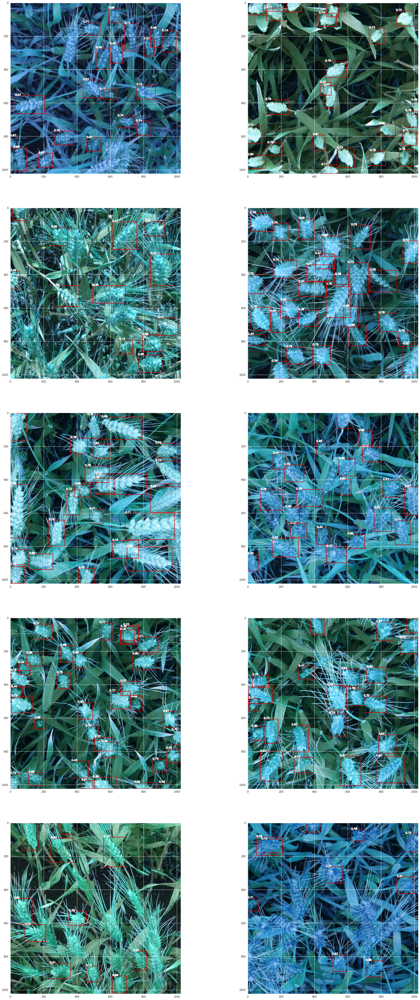

In [43]:
import torch
results = detect()

In [44]:
test_df = pd.DataFrame(results, columns=['image_id', 'PredictionString'])
test_df.to_csv('submission.csv', index=False)
test_df.head()

,image_id,PredictionString
0,cb8d261a3,0.7413 754 710 84 86 0.7375 644 679 98 70 0.71...
1,51f1be19e,0.6556 792 761 126 101 0.6537 766 882 150 105 ...
2,51b3e36ab,0.7630 448 320 146 99 0.7596 8 819 98 103 0.75...
3,348a992bb,0.7987 734 218 138 93 0.7732 595 440 124 106 0...
4,aac893a91,0.6786 612 917 85 103 0.6501 21 453 110 153 0....
